# Texas — Comprehensive Hydrographic Report

**Every forecast, histogram, trend, distribution, and teleconnection analysis**
available in the hydro-art analytics suite, applied to the five major
USGS-gauged rivers of Texas.

| River | USGS ID | Record |
|-------|---------|--------|
| Brazos River at Waco | 08096500 | 1960–2024 (65 yr) |
| Colorado River at Austin | 08158000 | 1960–2024 (65 yr) |
| Trinity River at Romayor | 08066500 | 1960–2024 (65 yr) |
| Guadalupe River at Victoria | 08176500 | 1940–2024 (85 yr) |
| Sabine River near Ruliff | 08030500 | 1940–2024 (85 yr) |

**Data sources:** USGS NWIS (public domain), NOAA CPC ONI, NOAA NCEI PDO —
all federal public domain, commercially sellable with attribution.


In [1]:
# ── imports & paths ──────────────────────────────────────────────────────
import sys
from pathlib import Path

REPO = Path(".").resolve().parent
sys.path.insert(0, str(REPO))

import numpy as np
import matplotlib
matplotlib.use("module://matplotlib_inline.backend_inline")
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.ticker as ticker
from scipy.stats import gaussian_kde

from src import flow_metrics as fm
from tools.nwis_gauge import GaugeProvider
from tools.climate_index import ClimateIndexProvider
from tools.monthly_flow import MONTH_ABBR

NAS_ROOT = "/Volumes/home/data/hydro-art"

%matplotlib inline
plt.rcParams.update({
    "figure.facecolor": "#07080c",
    "axes.facecolor": "#10121b",
    "axes.edgecolor": "#232838",
    "axes.labelcolor": "#e6ebf5",
    "text.color": "#e6ebf5",
    "xtick.color": "#8891a8",
    "ytick.color": "#8891a8",
    "figure.dpi": 140,
    "savefig.dpi": 140,
    "font.size": 10,
})

CYAN = "#00ffff"; MAGENTA = "#ff4d9a"; LIME = "#00ff9c"
VIOLET = "#9d00ff"; AMBER = "#ff9c3a"; RED = "#ff4d5e"
COOL_BLUE = "#00e5ff"; MUTED = "#8891a8"; LIGHT = "#e6ebf5"

# River colors for multi-river plots
RIVER_COLORS = {
    "Brazos": CYAN, "Colorado": MAGENTA, "Trinity": LIME,
    "Guadalupe": AMBER, "Sabine": VIOLET,
}

def complete_years(obs):
    """Filter to years where all 12 months are finite (no NaN gaps)."""
    return {y: v for y, v in obs.items() if np.all(np.isfinite(v))}

print("Texas hydrographic report — ready")


Texas hydrographic report — ready


---
## 1. Data Acquisition

Load real USGS gauge observations for five major Texas rivers + NOAA climate indices.


In [2]:
# ── gauge data ────────────────────────────────────────────────────────────
GAUGES = {
    "Brazos":    ("08096500", 1960, 2024),
    "Colorado":  ("08158000", 1960, 2024),
    "Trinity":   ("08066500", 1960, 2024),
    "Guadalupe": ("08176500", 1940, 2024),
    "Sabine":    ("08030500", 1940, 2024),
}

rivers = {}
for name, (site, start, end) in GAUGES.items():
    g = GaugeProvider(site, NAS_ROOT)
    obs = g.monthly_means(start, end)
    rivers[name] = {"provider": g, "obs": obs, "site": site}
    clean = complete_years(obs)
    yrs = sorted(clean.keys())
    print(f"{name:12s}: {g.name}")
    print(f"{'':12s}  {len(clean)} complete years: {yrs[0]}-{yrs[-1]}")
    print(f"{'':12s}  annual mean: {np.mean([np.mean(clean[y]) for y in yrs]):,.0f} cfs\n")

# ── climate indices ────────────────────────────────────────────────────────
oni_prov = ClimateIndexProvider("oni", NAS_ROOT)
pdo_prov = ClimateIndexProvider("pdo", NAS_ROOT)
oni = oni_prov.index_by_year(1940, 2024)
pdo = pdo_prov.index_by_year(1940, 2024)
print(f"ONI (ENSO): {len(oni)} years")
print(f"PDO: {len(pdo)} years")


Brazos      : USGS 08096500 Brazos Rv at Waco, TX
              65 complete years: 1960-2024
              annual mean: 2,187 cfs

Colorado    : USGS 08158000 Colorado Rv at Austin, TX
              65 complete years: 1960-2024
              annual mean: 1,552 cfs

Trinity     : USGS 08066500 Trinity Rv at Romayor, TX
              65 complete years: 1960-2024
              annual mean: 8,626 cfs

Guadalupe   : USGS 08176500 Guadalupe Rv at Victoria, TX
              85 complete years: 1940-2024
              annual mean: 1,873 cfs

Sabine      : USGS 08030500 Sabine Rv nr Ruliff, TX
              85 complete years: 1940-2024
              annual mean: 8,442 cfs

ONI (ENSO): 75 years
PDO: 85 years


---
## 2. Quick Data Summary


In [3]:
for name, r in rivers.items():
    clean = complete_years(r["obs"])
    years = sorted(clean.keys())
    annual = [float(np.mean(clean[y])) for y in years]
    peaks = [float(np.max(clean[y])) for y in years]
    lows = [float(np.min(clean[y][5:8])) for y in years]
    print(f"{'='*60}")
    print(f"  {name} River ({r['site']})")
    print(f"{'='*60}")
    print(f"  Record:         {years[0]}-{years[-1]} ({len(years)} complete years)")
    print(f"  Annual mean:    {np.mean(annual):,.1f} cfs")
    print(f"  Peak monthly:   {np.max(peaks):,.1f} cfs ({years[int(np.argmax(peaks))]})")
    print(f"  Lowest summer:  {np.min(lows):,.1f} cfs ({years[int(np.argmin(lows))]})")
    flash = [fm.flashiness(clean[y]) for y in years]
    print(f"  Flashiest year: {years[int(np.argmax(flash))]}")
    print()


  Brazos River (08096500)
  Record:         1960-2024 (65 complete years)
  Annual mean:    2,187.3 cfs
  Peak monthly:   28,500.0 cfs (1990)
  Lowest summer:  49.2 cfs (1978)
  Flashiest year: 1965

  Colorado River (08158000)
  Record:         1960-2024 (65 complete years)
  Annual mean:    1,552.1 cfs
  Peak monthly:   25,889.0 cfs (1992)
  Lowest summer:  166.9 cfs (2024)
  Flashiest year: 2016

  Trinity River (08066500)
  Record:         1960-2024 (65 complete years)
  Annual mean:    8,625.7 cfs
  Peak monthly:   82,529.0 cfs (2024)
  Lowest summer:  403.6 cfs (1972)
  Flashiest year: 1966

  Guadalupe River (08176500)
  Record:         1940-2024 (85 complete years)
  Annual mean:    1,873.0 cfs
  Peak monthly:   30,444.6 cfs (1998)
  Lowest summer:  37.6 cfs (1956)
  Flashiest year: 1998

  Sabine River (08030500)
  Record:         1940-2024 (85 complete years)
  Annual mean:    8,442.5 cfs
  Peak monthly:   66,022.6 cfs (1953)
  Lowest summer:  363.6 cfs (1956)
  Flashiest yea

---
## 3. Year-over-Year Hydrographs

Every year's 12-month hydrograph overlaid for all five rivers.


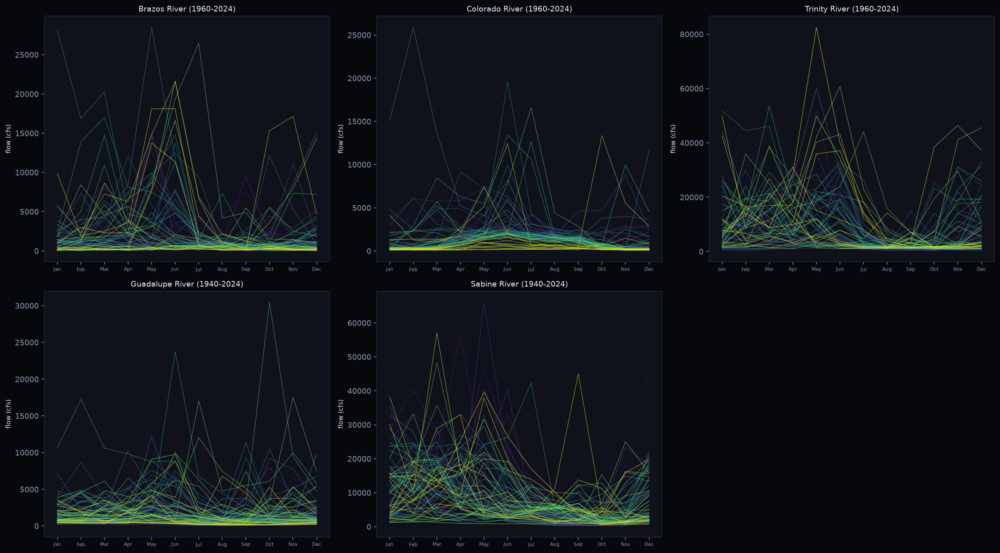

In [4]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes_flat = axes.flat
for i, (name, r) in enumerate(rivers.items()):
    ax = axes_flat[i]
    obs = r["obs"]
    years = sorted(obs.keys())
    cmap = plt.get_cmap("viridis")
    span = max(years) - min(years) or 1
    for y in years:
        ax.plot(range(1, 13), obs[y], color=cmap((y - min(years)) / span), lw=0.7, alpha=0.6)
    ax.set_xticks(range(1, 13)); ax.set_xticklabels(MONTH_ABBR, fontsize=6)
    ax.set_ylabel("flow (cfs)", fontsize=8)
    ax.set_title(f"{name} River ({min(years)}-{max(years)})", fontsize=10)
axes_flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 4. Typical Year — Mean + Confidence Band


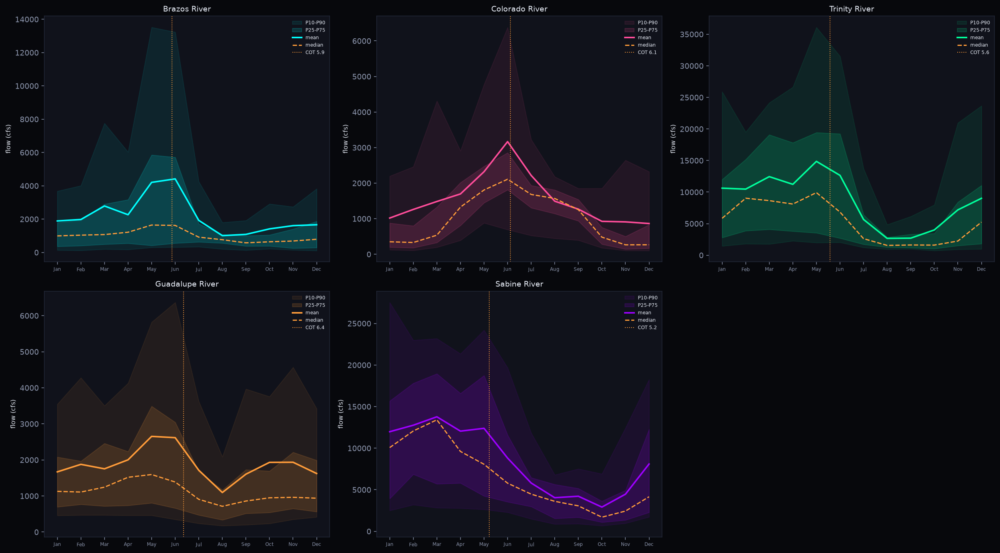

In [5]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    obs = r["obs"]
    years = sorted(obs.keys())
    stack = np.array([obs[y] for y in years])
    mean = np.nanmean(stack, axis=0)
    p10, p90 = np.nanpercentile(stack, 10, axis=0), np.nanpercentile(stack, 90, axis=0)
    p25, p75 = np.nanpercentile(stack, 25, axis=0), np.nanpercentile(stack, 75, axis=0)
    m = range(1, 13)
    ax.fill_between(m, p10, p90, color=RIVER_COLORS[name], alpha=0.08, label="P10-P90")
    ax.fill_between(m, p25, p75, color=RIVER_COLORS[name], alpha=0.15, label="P25-P75")
    ax.plot(m, mean, color=RIVER_COLORS[name], lw=2, label="mean")
    ax.plot(m, np.nanmedian(stack, axis=0), color=AMBER, lw=1.5, ls="--", label="median")
    cot = fm.center_of_timing(mean)
    ax.axvline(cot, color=AMBER, ls=":", lw=1, label=f"COT {cot:.1f}")
    ax.set_xticks(list(m)); ax.set_xticklabels(MONTH_ABBR, fontsize=6)
    ax.set_ylabel("flow (cfs)", fontsize=8)
    ax.set_title(f"{name} River", fontsize=10)
    ax.legend(fontsize=6, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 5. All Rivers — Typical Year Overlay

Compare the seasonal shape of all five Texas rivers on one plot.


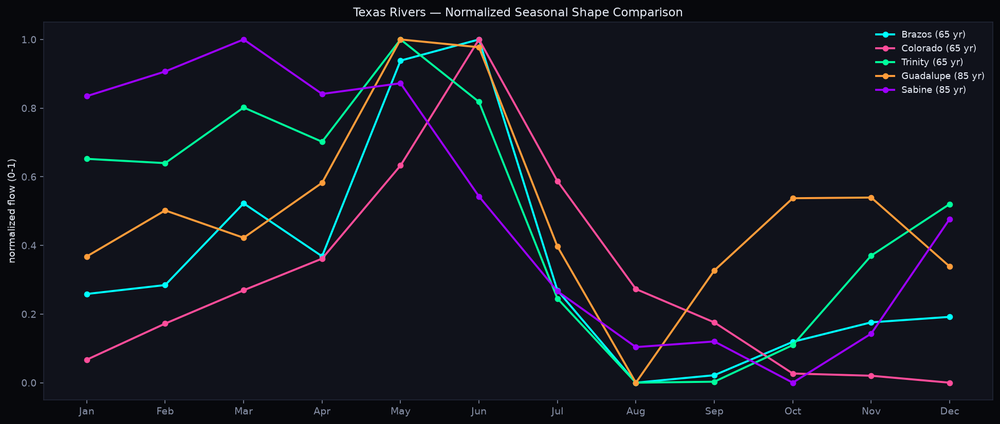

In [6]:
fig, ax = plt.subplots(figsize=(14, 6))
m = range(1, 13)
for name, r in rivers.items():
    clean = complete_years(r["obs"])
    years = sorted(clean.keys())
    stack = np.array([clean[y] for y in years])
    mean = np.nanmean(stack, axis=0)
    # Normalize to [0,1] for shape comparison
    norm = (mean - mean.min()) / (mean.max() - mean.min() + 1e-9)
    ax.plot(m, norm, "o-", color=RIVER_COLORS[name], lw=2, ms=5, label=f"{name} ({len(years)} yr)")
ax.set_xticks(list(m)); ax.set_xticklabels(MONTH_ABBR)
ax.set_ylabel("normalized flow (0-1)")
ax.set_title("Texas Rivers — Normalized Seasonal Shape Comparison")
ax.legend(fontsize=9, frameon=False)
plt.tight_layout(); plt.show()


---
## 6. Long-Record Trend — Mann-Kendall + Sen's Slope


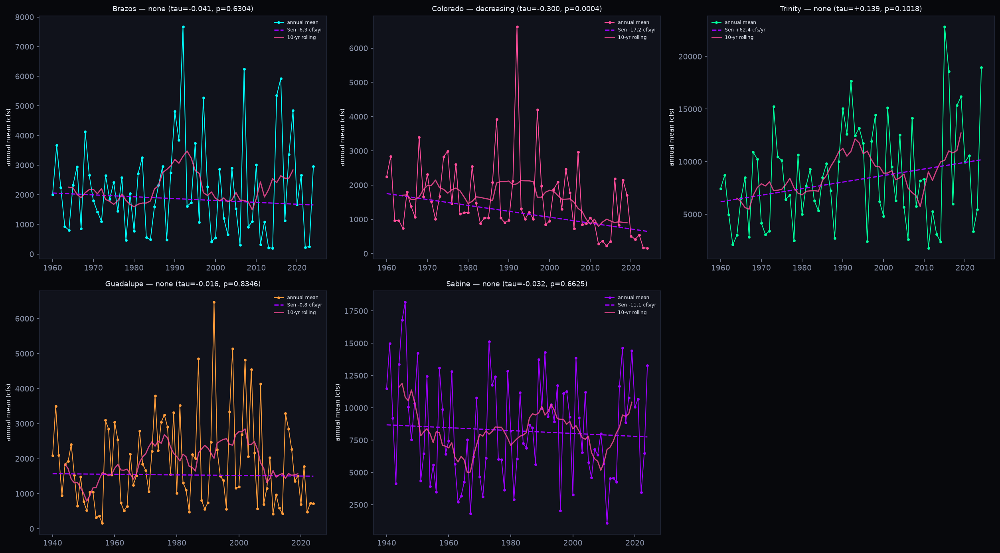

Brazos      : none (tau=-0.041, p=0.6304, Sen=-6.3 cfs/yr)
Colorado    : decreasing (tau=-0.300, p=0.0004, Sen=-17.2 cfs/yr)
Trinity     : none (tau=+0.139, p=0.1018, Sen=+62.4 cfs/yr)
Guadalupe   : none (tau=-0.016, p=0.8346, Sen=-0.8 cfs/yr)
Sabine      : none (tau=-0.032, p=0.6625, Sen=-11.1 cfs/yr)


In [7]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
trends = {}
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    years = sorted(clean.keys())
    annual = np.array([float(np.mean(clean[y])) for y in years])
    mk = fm.mann_kendall(annual)
    slope = fm.sens_slope(annual)
    x = np.arange(len(years))
    fit = np.median(annual) + slope * (x - np.median(x))
    ax.plot(years, annual, "o-", color=RIVER_COLORS[name], lw=1, ms=2.5, label="annual mean")
    ax.plot(years, fit, "--", color=VIOLET, lw=1.5, label=f"Sen {slope:+.1f} cfs/yr")
    if len(annual) >= 10:
        kernel = np.ones(10) / 10
        rolling = np.convolve(annual, kernel, mode="valid")
        ax.plot(years[4:4+len(rolling)], rolling, color=MAGENTA, lw=1.5, alpha=0.8, label="10-yr rolling")
    ax.set_ylabel("annual mean (cfs)", fontsize=8)
    ax.set_title(f"{name} — {mk.trend} (tau={mk.tau:+.3f}, p={mk.p:.4f})", fontsize=9)
    ax.legend(fontsize=6, frameon=False)
    trends[name] = {"trend": mk.trend, "tau": mk.tau, "p": mk.p, "slope": slope}
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()
for n, t in trends.items():
    print(f"{n:12s}: {t['trend']} (tau={t['tau']:+.3f}, p={t['p']:.4f}, Sen={t['slope']:+.1f} cfs/yr)")


---
## 7. Summer Low-Flow Trend (Jun-Aug Minimum)


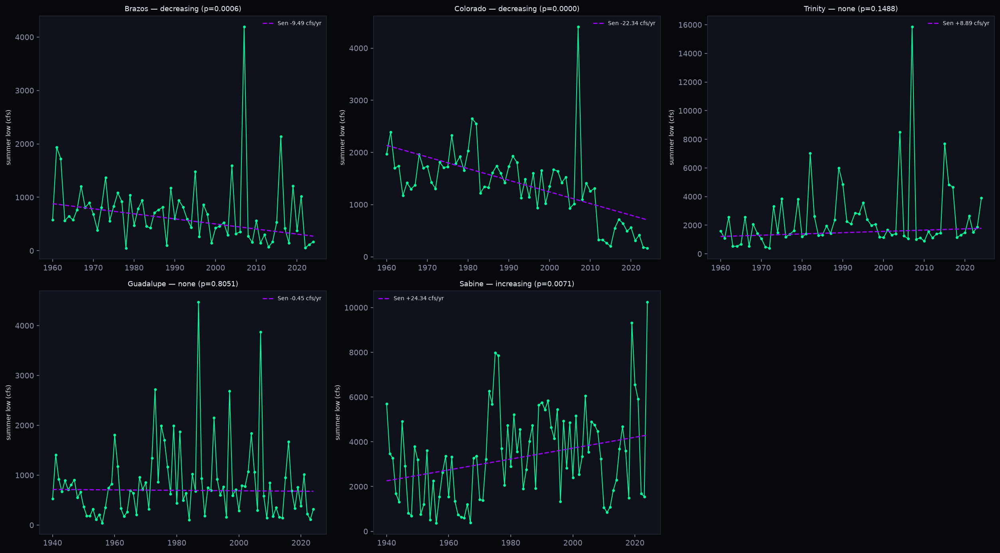

In [8]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    years = sorted(clean.keys())
    low = np.array([float(np.min(clean[y][5:8])) for y in years])
    slope = fm.sens_slope(low)
    mk = fm.mann_kendall(low)
    x = np.arange(len(years))
    fit = np.median(low) + slope * (x - np.median(x))
    ax.plot(years, low, "o-", color=LIME, lw=1, ms=2.5)
    ax.plot(years, fit, "--", color=VIOLET, lw=1.5, label=f"Sen {slope:+.2f} cfs/yr")
    ax.set_ylabel("summer low (cfs)", fontsize=8)
    ax.set_title(f"{name} — {mk.trend} (p={mk.p:.4f})", fontsize=9)
    ax.legend(fontsize=7, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 8. Peak Flow Trend (Annual Maximum Monthly)


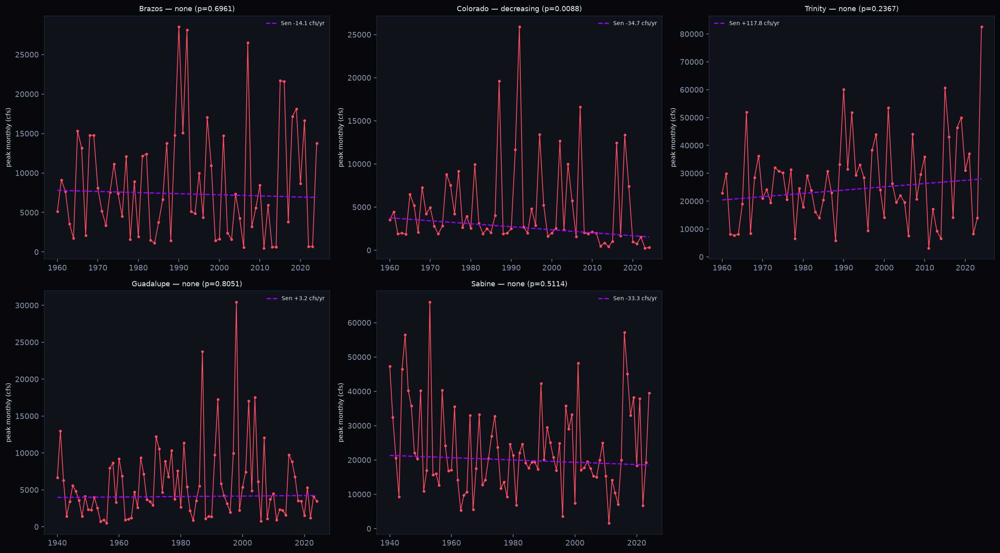

In [9]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    years = sorted(clean.keys())
    peak = np.array([float(np.max(clean[y])) for y in years])
    slope = fm.sens_slope(peak)
    mk = fm.mann_kendall(peak)
    x = np.arange(len(years))
    fit = np.median(peak) + slope * (x - np.median(x))
    ax.plot(years, peak, "o-", color=RED, lw=1, ms=2.5)
    ax.plot(years, fit, "--", color=VIOLET, lw=1.5, label=f"Sen {slope:+.1f} cfs/yr")
    ax.set_ylabel("peak monthly (cfs)", fontsize=8)
    ax.set_title(f"{name} — {mk.trend} (p={mk.p:.4f})", fontsize=9)
    ax.legend(fontsize=7, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 9. Timing Drift — Center of Timing per Year


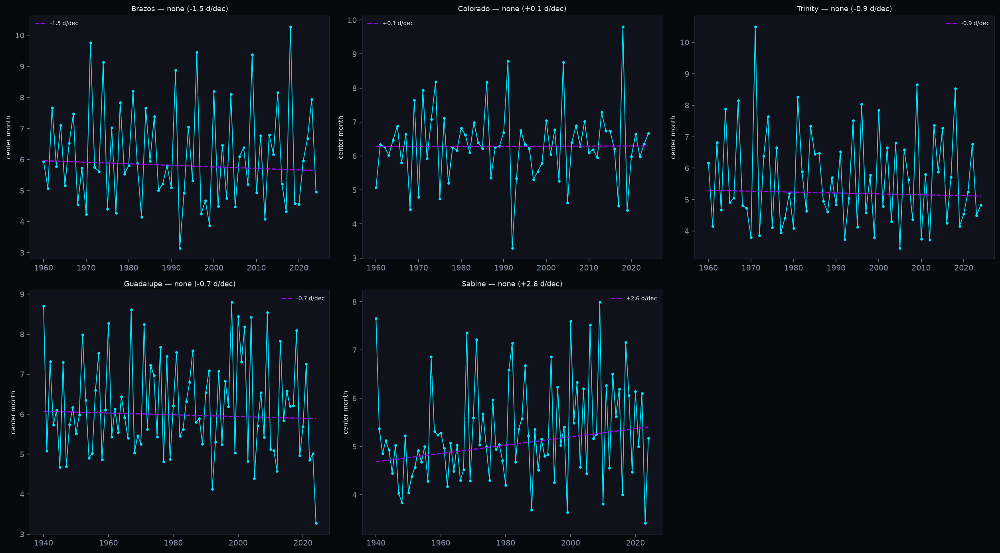

In [10]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    tt = fm.center_of_timing_trend(clean)
    years = list(tt.years)
    centers = np.array(tt.center_months)
    ax.plot(years, centers, "o-", color=COOL_BLUE, lw=1, ms=2.5)
    x = np.arange(len(years))
    fit = np.median(centers) + tt.slope_months_per_year * (x - np.median(x))
    ax.plot(years, fit, "--", color=VIOLET, lw=1.5, label=f"{tt.days_per_decade:+.1f} d/dec")
    ax.set_ylabel("center month", fontsize=8)
    ax.set_title(f"{name} — {tt.trend} ({tt.days_per_decade:+.1f} d/dec)", fontsize=9)
    ax.legend(fontsize=7, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 10. ENSO Teleconnection — Peak Flow vs. ONI + PDO


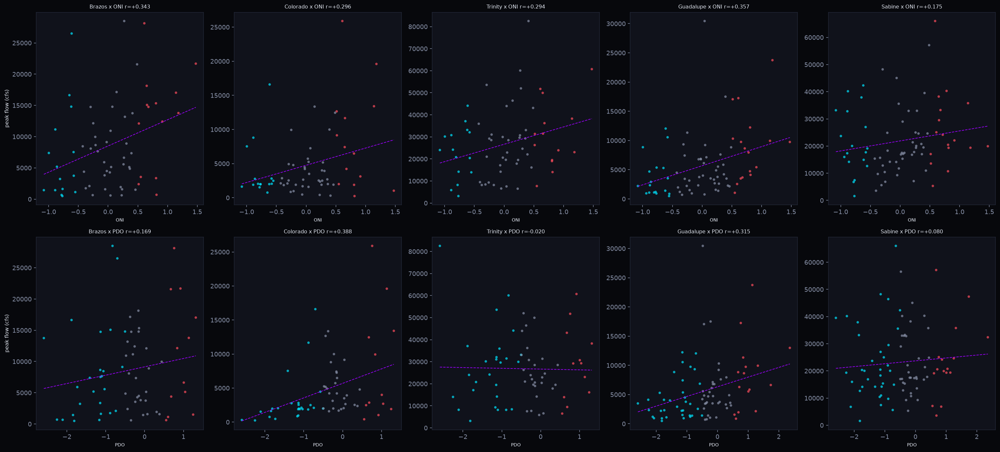

In [11]:
fig, axes = plt.subplots(2, 5, figsize=(22, 10))
for i, (name, r) in enumerate(rivers.items()):
    clean = complete_years(r["obs"])
    years = sorted(clean.keys())
    peak_by_year = {y: float(np.max(clean[y])) for y in years}
    for j, (idx, idx_name) in enumerate([(oni, "ONI"), (pdo, "PDO")]):
        ax = axes[j, i]
        metric, index = fm.align_index(peak_by_year, idx)
        r0 = fm.correlate(peak_by_year, idx)
        colors = [RED if v >= 0.5 else COOL_BLUE if v <= -0.5 else MUTED for v in index]
        ax.scatter(index, metric, s=15, c=colors, alpha=0.7, edgecolors="none")
        z = np.polyfit(index, metric, 1)
        xfit = np.linspace(index.min(), index.max(), 50)
        ax.plot(xfit, np.polyval(z, xfit), "--", color=VIOLET, lw=1)
        ax.set_xlabel(idx_name, fontsize=7)
        if i == 0: ax.set_ylabel("peak flow (cfs)", fontsize=8)
        ax.set_title(f"{name} x {idx_name} r={r0:+.3f}", fontsize=8)
plt.tight_layout(); plt.show()


---
## 11. ENSO Composite Hydrographs


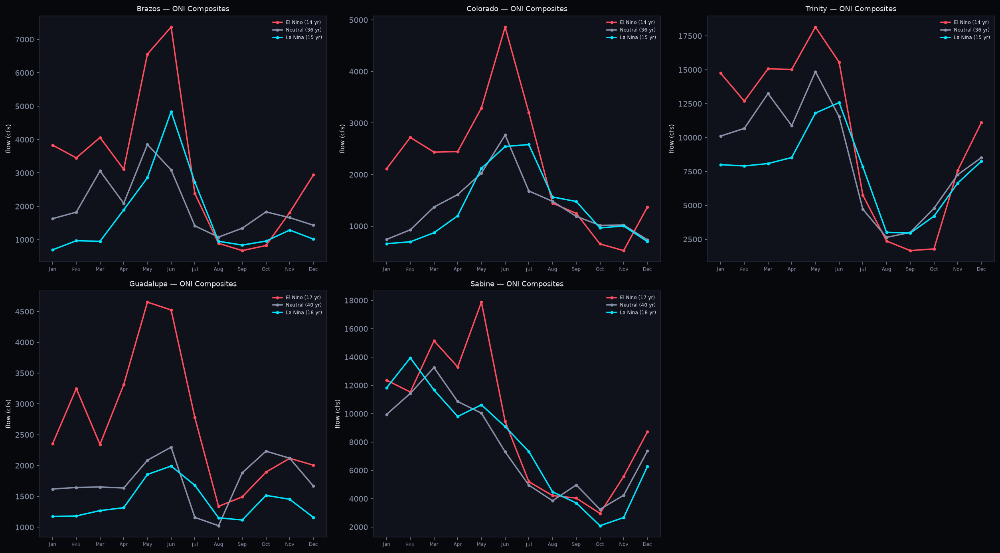

In [12]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
m = range(1, 13)
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    pc = fm.composite_hydrographs(clean, oni)
    for label, vec, color in (("El Nino", pc.warm, RED),
                               ("Neutral", pc.neutral, MUTED),
                               ("La Nina", pc.cool, COOL_BLUE)):
        if vec is not None:
            attr = {"El Nino": "warm_years", "Neutral": "neutral_years", "La Nina": "cool_years"}[label]
            n_yrs = len(getattr(pc, attr))
            ax.plot(m, vec, "-o", ms=3, lw=1.8, color=color, label=f"{label} ({n_yrs} yr)")
    ax.set_xticks(list(m)); ax.set_xticklabels(MONTH_ABBR, fontsize=6)
    ax.set_ylabel("flow (cfs)", fontsize=8)
    ax.set_title(f"{name} — ONI Composites", fontsize=9)
    ax.legend(fontsize=6, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 12. Flow-Duration Curves by Decade


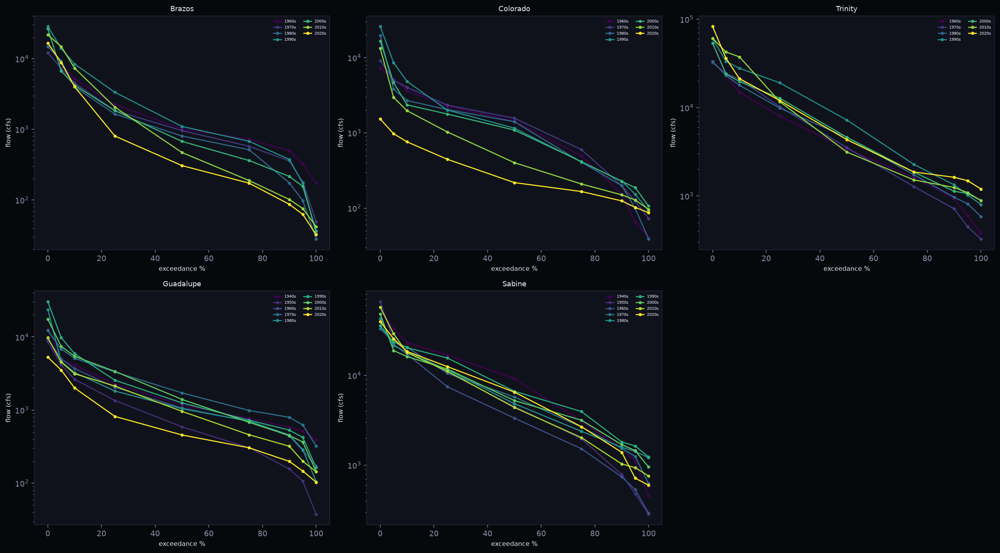

In [13]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
quantiles = [0, 5, 10, 25, 50, 75, 90, 95, 100]
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    decades = fm.decade_flow_duration(clean, quantiles)
    cmap = plt.get_cmap("viridis")
    span = max(1, len(decades) - 1)
    for j, d in enumerate(decades):
        ax.plot(d.quantiles, np.clip(d.flows, 1e-2, None), "-o", ms=3,
                color=cmap(j / span), lw=1.4, label=f"{d.decade}s")
    ax.set_yscale("log")
    ax.set_xlabel("exceedance %", fontsize=8)
    ax.set_ylabel("flow (cfs)", fontsize=8)
    ax.set_title(f"{name}", fontsize=9)
    ax.legend(fontsize=5, frameon=False, ncol=2)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 13. Analog Years — Most Similar Historical Shapes


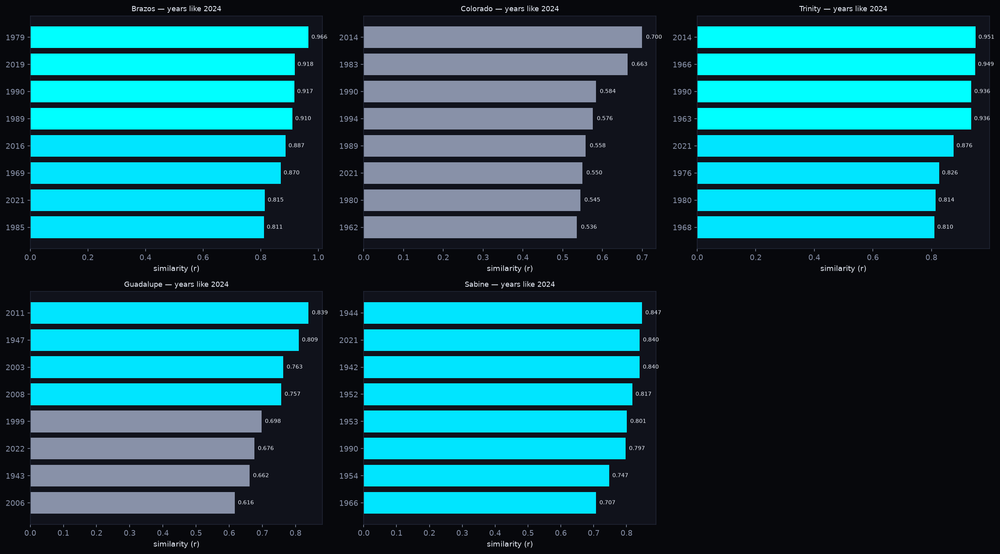

In [14]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    target = max(clean.keys())
    analogs = fm.analog_years(clean, target, n=8)
    labels = [str(a.year) for a in analogs]
    sims = [a.similarity for a in analogs]
    colors = [CYAN if s > 0.9 else COOL_BLUE if s > 0.7 else MUTED for s in sims]
    bars = ax.barh(labels, sims, color=colors)
    ax.invert_yaxis()
    ax.set_xlabel("similarity (r)")
    ax.set_title(f"{name} — years like {target}", fontsize=9)
    for bar, s in zip(bars, sims):
        ax.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
                f"{s:.3f}", va="center", fontsize=7, color=LIGHT)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 14. Drought / Flood Record Book


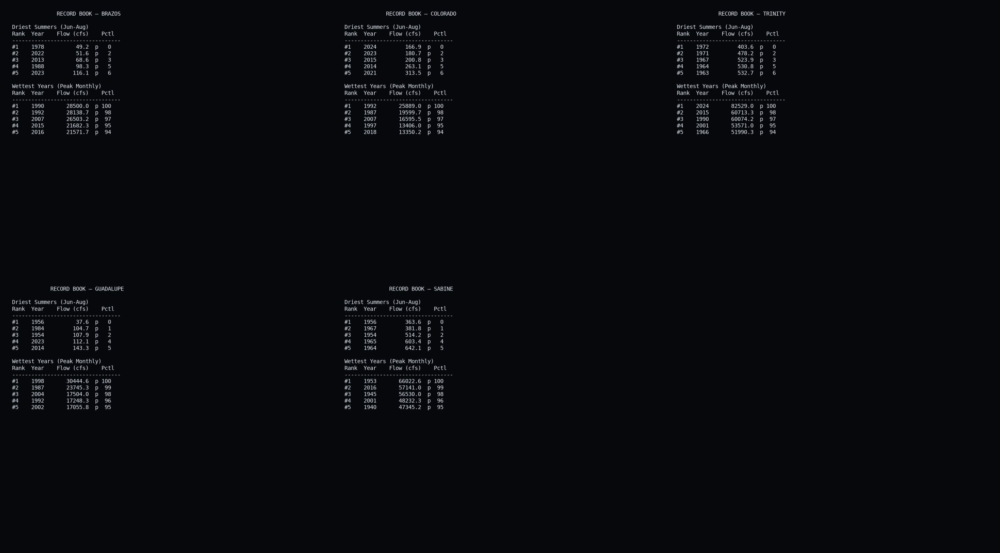

In [15]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    rb = fm.record_book(clean, n=5)
    lines = [f"{'RECORD BOOK — ' + name.upper():^48}", ""]
    lines.append("Driest Summers (Jun-Aug)")
    lines.append(f"{'Rank':>4}  {'Year':>4}  {'Flow (cfs)':>12}  {'Pctl':>6}")
    lines.append("-" * 34)
    for e in rb.driest_summers:
        lines.append(f"#{e.rank:<3}  {e.year}  {e.value:>12.1f}  p{e.percentile*100:>4.0f}")
    lines += ["", "Wettest Years (Peak Monthly)"]
    lines.append(f"{'Rank':>4}  {'Year':>4}  {'Flow (cfs)':>12}  {'Pctl':>6}")
    lines.append("-" * 34)
    for e in rb.wettest_years:
        lines.append(f"#{e.rank:<3}  {e.year}  {e.value:>12.1f}  p{e.percentile*100:>4.0f}")
    ax.text(0.02, 0.98, "\n".join(lines), transform=ax.transAxes, va="top",
            family="monospace", fontsize=7, color=LIGHT)
    ax.set_axis_off()
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 15. Seasonal Ratio — Wet/Dry Season Balance


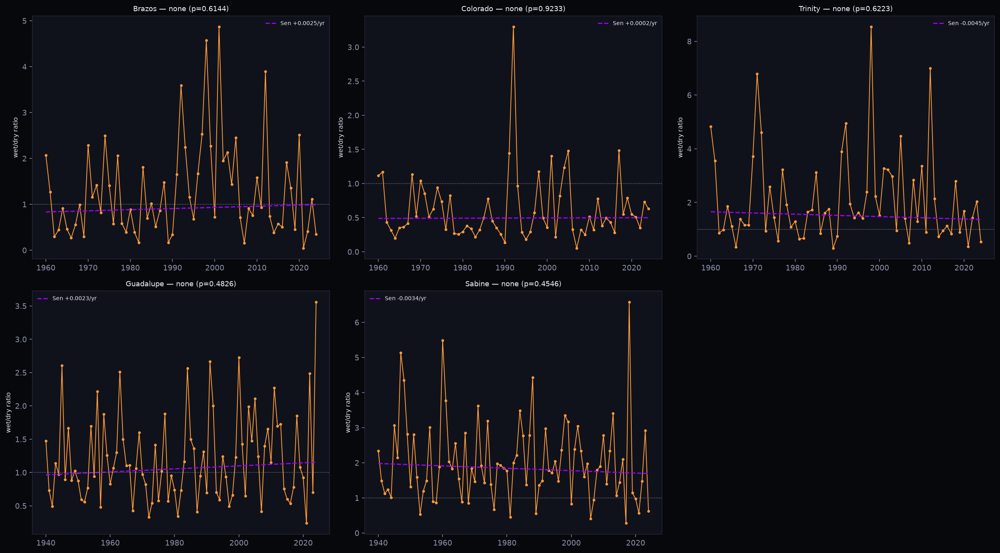

In [16]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    years = sorted(clean.keys())
    ratios = [fm.seasonal_ratio(clean[y]) for y in years]
    mk = fm.mann_kendall(ratios)
    slope = fm.sens_slope(ratios)
    x = np.arange(len(years))
    fit = np.median(ratios) + slope * (x - np.median(x))
    ax.plot(years, ratios, "o-", color=AMBER, lw=1, ms=2.5)
    ax.plot(years, fit, "--", color=VIOLET, lw=1.5, label=f"Sen {slope:+.4f}/yr")
    ax.axhline(1.0, color=MUTED, ls=":", lw=0.8)
    ax.set_ylabel("wet/dry ratio", fontsize=8)
    ax.set_title(f"{name} — {mk.trend} (p={mk.p:.4f})", fontsize=9)
    ax.legend(fontsize=7, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 16. Flashiness Index (Richards-Baker)


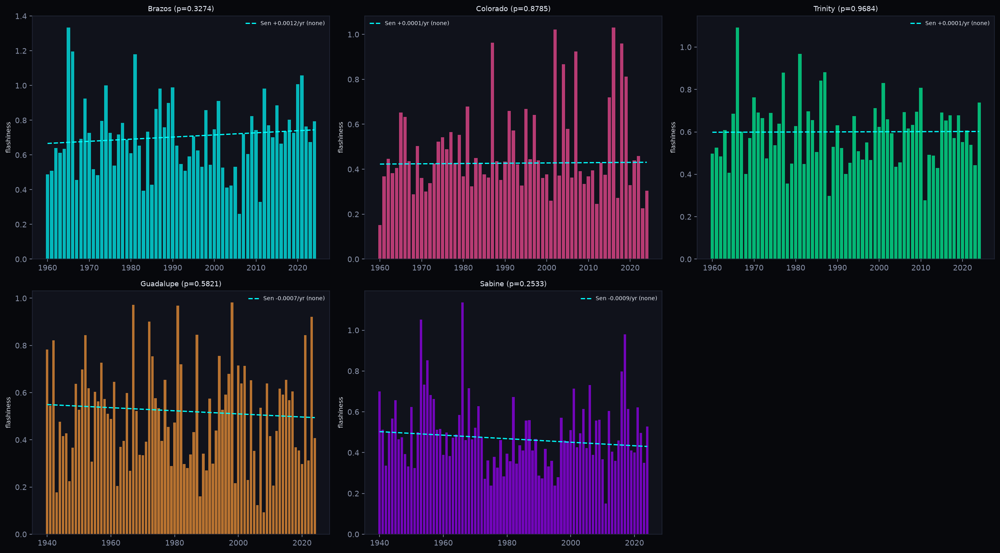

In [17]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    years = sorted(clean.keys())
    flash = [fm.flashiness(clean[y]) for y in years]
    mk = fm.mann_kendall(flash)
    slope = fm.sens_slope(flash)
    x = np.arange(len(years))
    fit = np.median(flash) + slope * (x - np.median(x))
    ax.bar(years, flash, color=RIVER_COLORS[name], alpha=0.7, width=0.8)
    ax.plot(years, fit, "--", color=CYAN, lw=1.5, label=f"Sen {slope:+.4f}/yr ({mk.trend})")
    ax.set_ylabel("flashiness", fontsize=8)
    ax.set_title(f"{name} (p={mk.p:.4f})", fontsize=9)
    ax.legend(fontsize=7, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 17. Rolling 30-Year Climate Normals


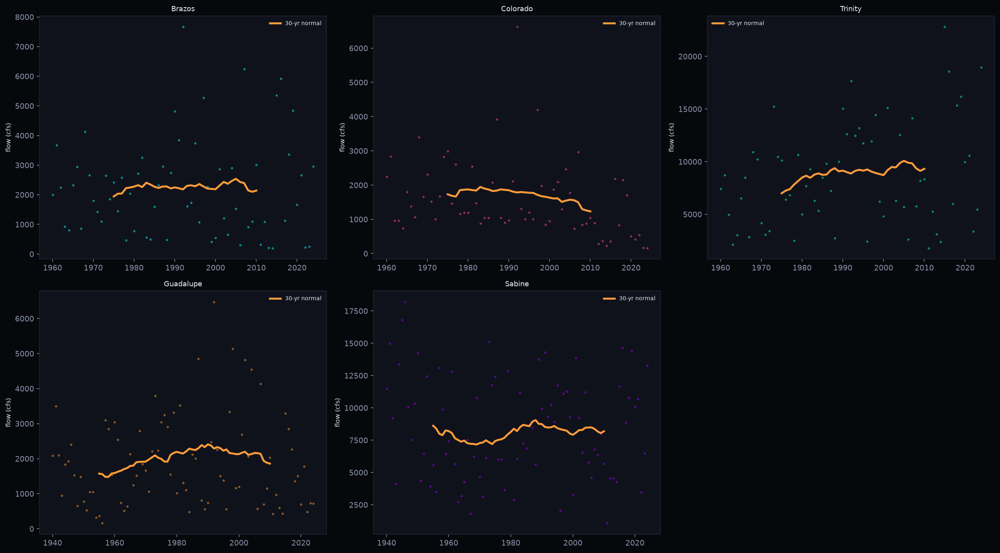

In [18]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    obs = r["obs"]
    years = sorted(obs.keys())
    annual = [float(np.nanmean(obs[y])) for y in years]
    if len(annual) >= 30:
        normals = fm.rolling_normals(annual, window=30)
        center_years = [years[n.start + 15] for n in normals]
        means = [n.mean for n in normals]
        ax.plot(years, annual, "o", color=RIVER_COLORS[name], ms=2, alpha=0.4)
        ax.plot(center_years, means, "-", color=AMBER, lw=2.5, label="30-yr normal")
    ax.set_ylabel("flow (cfs)", fontsize=8)
    ax.set_title(name, fontsize=9)
    ax.legend(fontsize=7, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 18. Monthly Flow Histograms (Brazos + Sabine)

Two representative rivers showing 12-month flow distributions.


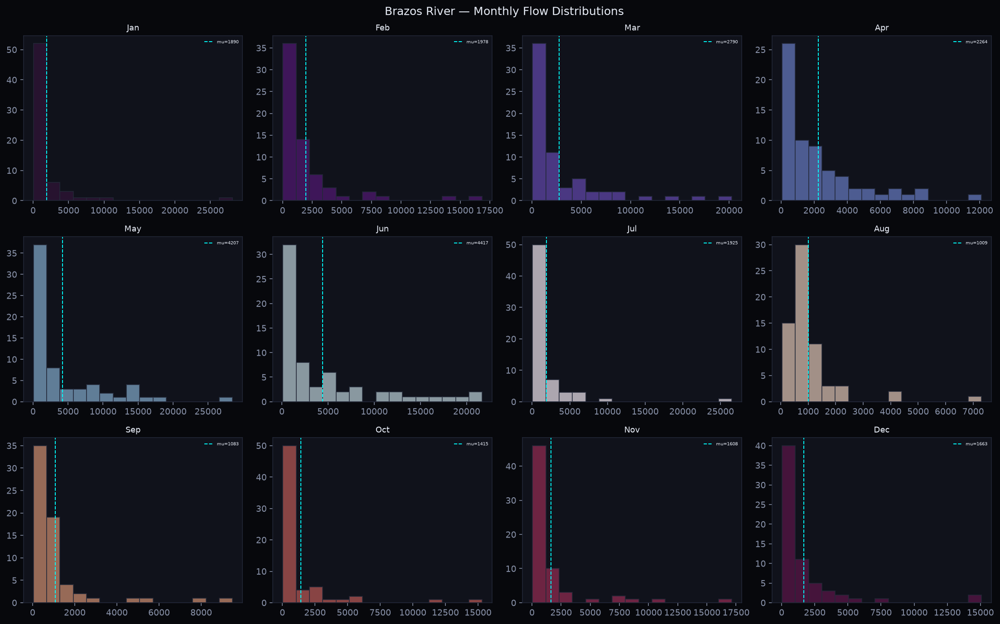

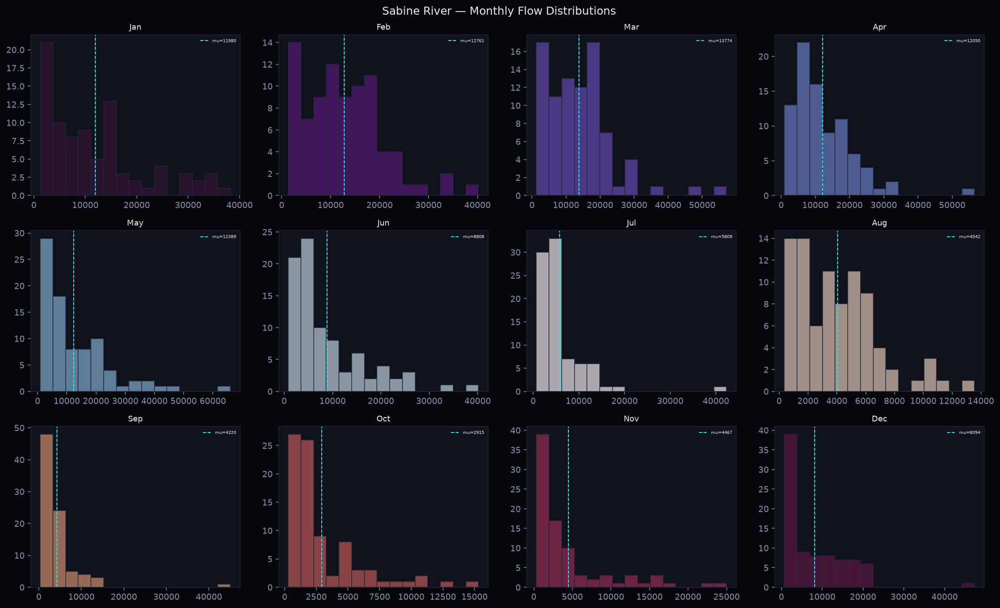

In [19]:
for name in ["Brazos", "Sabine"]:
    obs = rivers[name]["obs"]
    years = sorted(obs.keys())
    fig, axes = plt.subplots(3, 4, figsize=(16, 10))
    fig.suptitle(f"{name} River — Monthly Flow Distributions", fontsize=13, color=LIGHT)
    cmap = plt.get_cmap("twilight_shifted")
    for m_idx in range(12):
        ax = axes[m_idx // 4, m_idx % 4]
        vals = [obs[y][m_idx] for y in years if np.isfinite(obs[y][m_idx])]
        ax.hist(vals, bins=15, color=cmap(m_idx / 12), alpha=0.75, edgecolor="#232838")
        ax.axvline(np.mean(vals), color=CYAN, ls="--", lw=1, label=f"mu={np.mean(vals):.0f}")
        ax.set_title(MONTH_ABBR[m_idx], fontsize=9)
        ax.legend(fontsize=5, frameon=False)
    plt.tight_layout(); plt.show()


---
## 19. Annual Flow Histogram + KDE


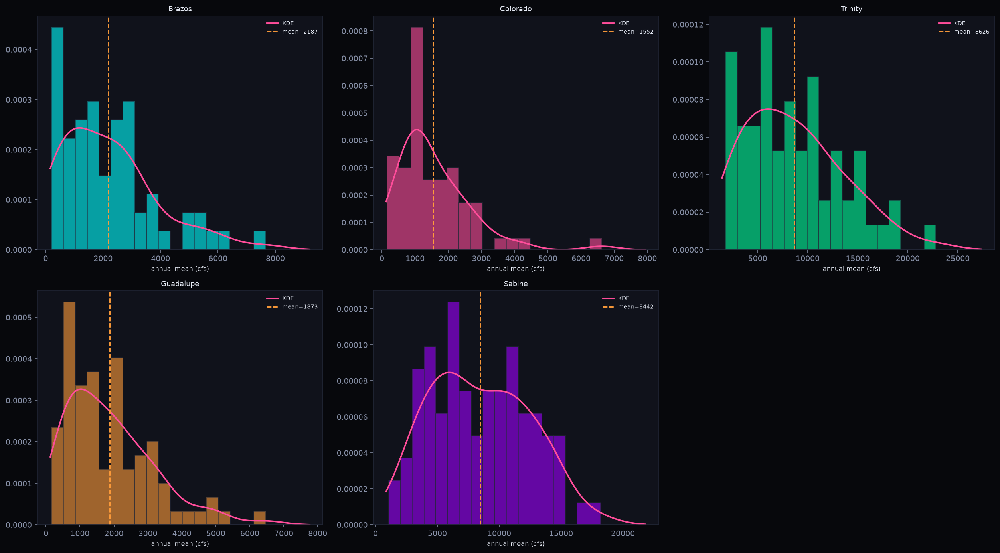

In [20]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    years = sorted(clean.keys())
    annual = np.array([float(np.mean(clean[y])) for y in years])
    ax.hist(annual, bins=18, color=RIVER_COLORS[name], alpha=0.6, edgecolor="#232838", density=True)
    try:
        kde = gaussian_kde(annual)
        x_kde = np.linspace(annual.min() * 0.8, annual.max() * 1.2, 200)
        ax.plot(x_kde, kde(x_kde), color=MAGENTA, lw=2, label="KDE")
    except Exception: pass
    ax.axvline(np.mean(annual), color=AMBER, ls="--", lw=1.5, label=f"mean={np.mean(annual):.0f}")
    ax.set_xlabel("annual mean (cfs)", fontsize=8)
    ax.set_title(name, fontsize=9)
    ax.legend(fontsize=7, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 20. Cross-Gauge Correlation Matrix

Pearson correlation of annual-mean flows between all five rivers.


Common years: 1960-2024 (65 yr)


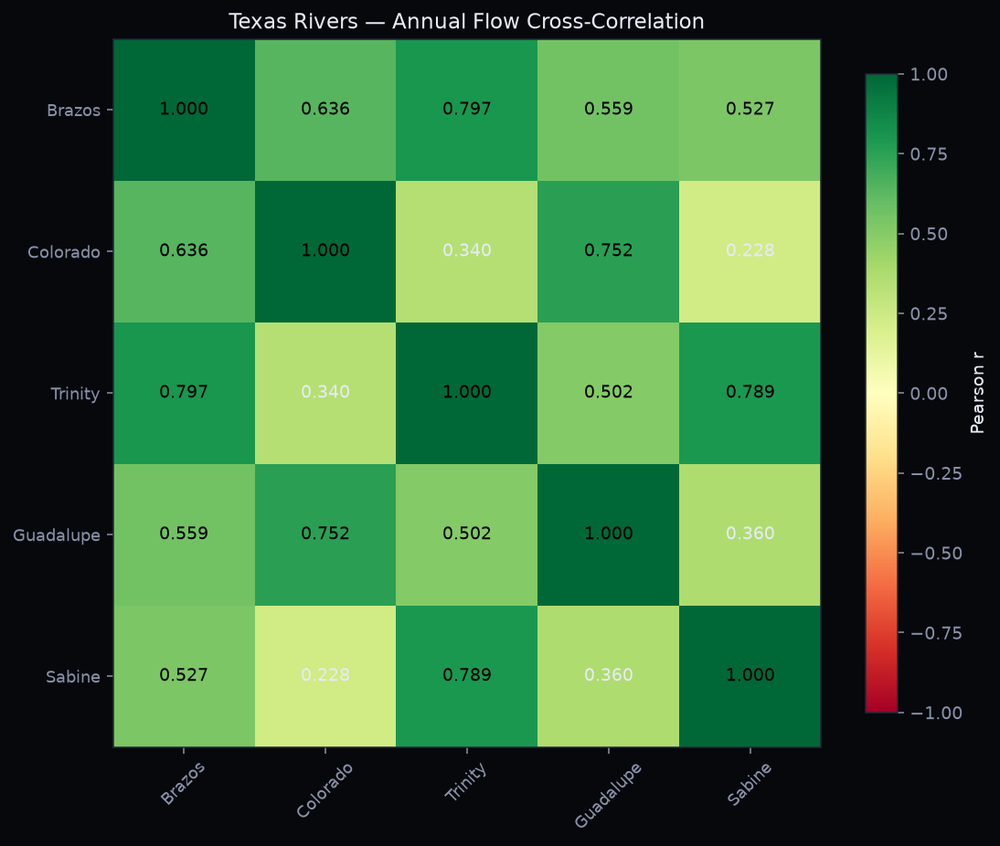

In [21]:
names = list(rivers.keys())
# Common year range
all_years = [set(complete_years(r["obs"]).keys()) for r in rivers.values()]
common = sorted(set.intersection(*all_years))
print(f"Common years: {common[0]}-{common[-1]} ({len(common)} yr)")

mat = np.zeros((5, 5))
ann = {}
for i, name in enumerate(names):
    clean = complete_years(rivers[name]["obs"])
    ann[name] = np.array([float(np.mean(clean[y])) for y in common])

for i in range(5):
    for j in range(5):
        mat[i, j] = fm.pearson_r(ann[names[i]], ann[names[j]])

fig, ax = plt.subplots(figsize=(8, 7))
im = ax.imshow(mat, cmap="RdYlGn", vmin=-1, vmax=1)
ax.set_xticks(range(5)); ax.set_xticklabels(names, fontsize=9, rotation=45)
ax.set_yticks(range(5)); ax.set_yticklabels(names, fontsize=9)
for i in range(5):
    for j in range(5):
        ax.text(j, i, f"{mat[i,j]:.3f}", ha="center", va="center", fontsize=10,
                color="black" if abs(mat[i,j]) > 0.4 else LIGHT)
fig.colorbar(im, ax=ax, label="Pearson r", shrink=0.8)
ax.set_title("Texas Rivers — Annual Flow Cross-Correlation")
plt.tight_layout(); plt.show()


---
## 21. Heatmaps — Month x Year Flow (Brazos + Trinity)


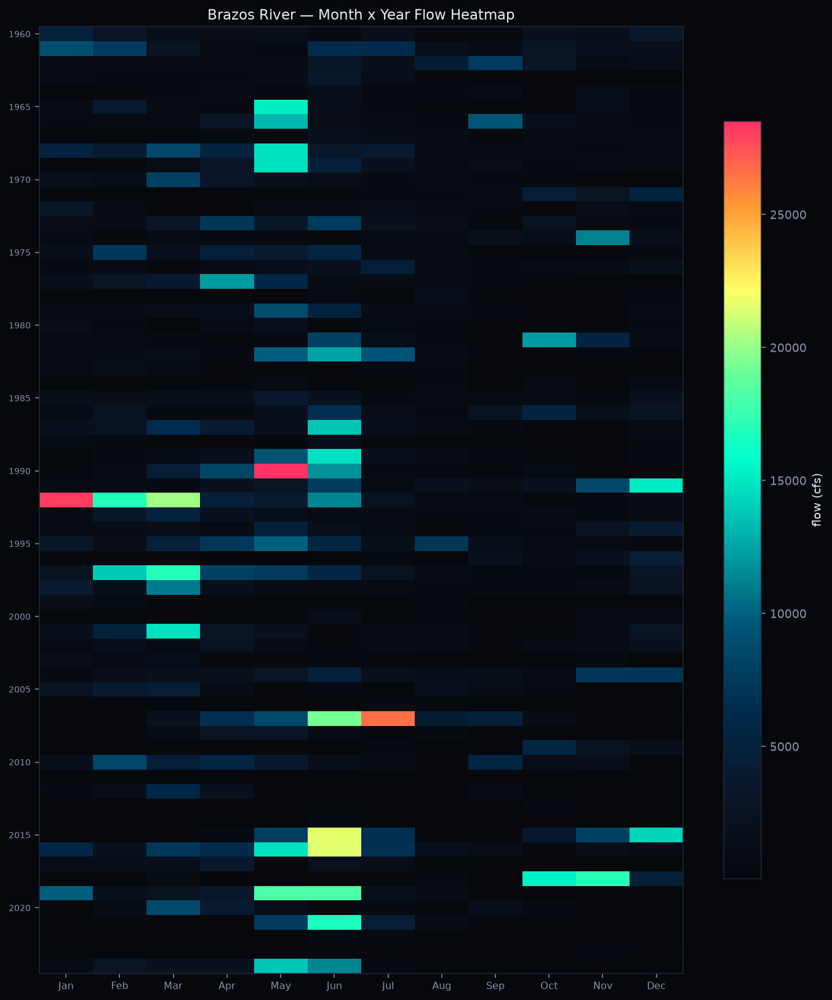

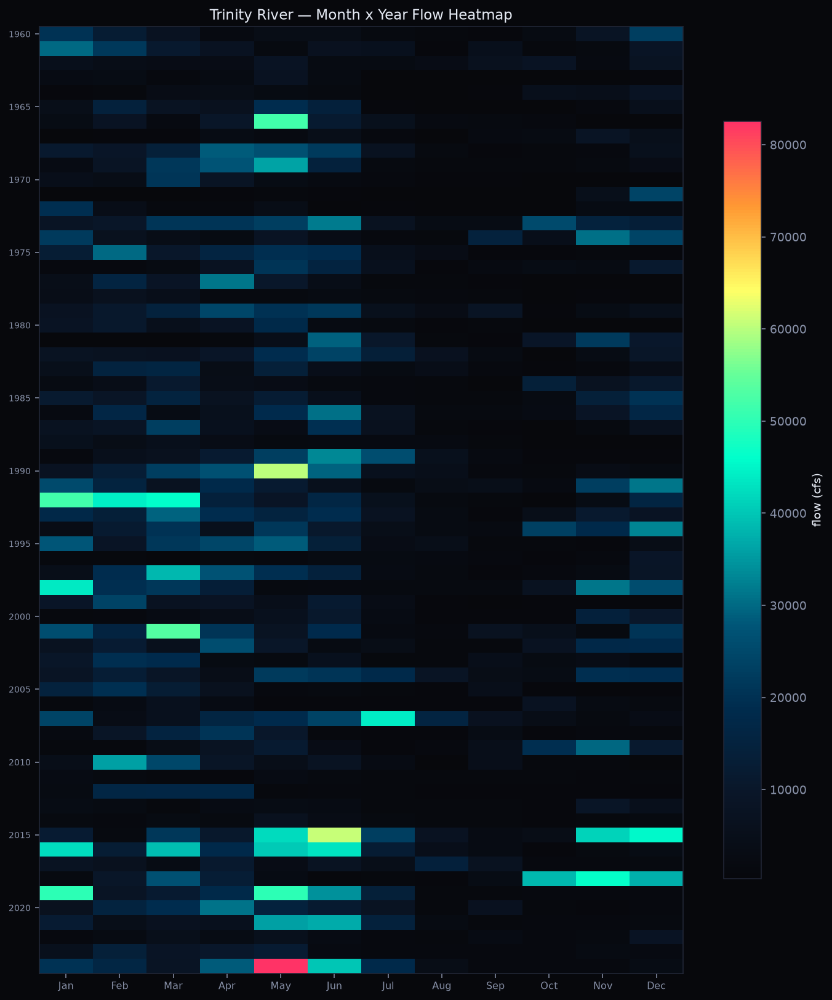

In [22]:
neon_cmap = LinearSegmentedColormap.from_list(
    "neon", ["#07080c", "#0a1628", "#002b4d", "#005577", "#00aaaa",
             "#00ffcc", "#66ff99", "#ffff66", "#ff9933", "#ff3366"])
for name in ["Brazos", "Trinity"]:
    obs = rivers[name]["obs"]
    years = sorted(obs.keys())
    mat = np.array([obs[y] for y in years])
    fig, ax = plt.subplots(figsize=(10, max(6, len(years) * 0.18)))
    im = ax.imshow(mat, aspect="auto", cmap=neon_cmap, interpolation="nearest")
    ax.set_xticks(range(12)); ax.set_xticklabels(MONTH_ABBR, fontsize=8)
    ytick_idx = list(range(0, len(years), 5))
    ax.set_yticks(ytick_idx); ax.set_yticklabels([years[i] for i in ytick_idx], fontsize=7)
    ax.set_title(f"{name} River — Month x Year Flow Heatmap")
    fig.colorbar(im, ax=ax, label="flow (cfs)", shrink=0.8)
    plt.tight_layout(); plt.show()


---
## 22. Monthly Box Plots


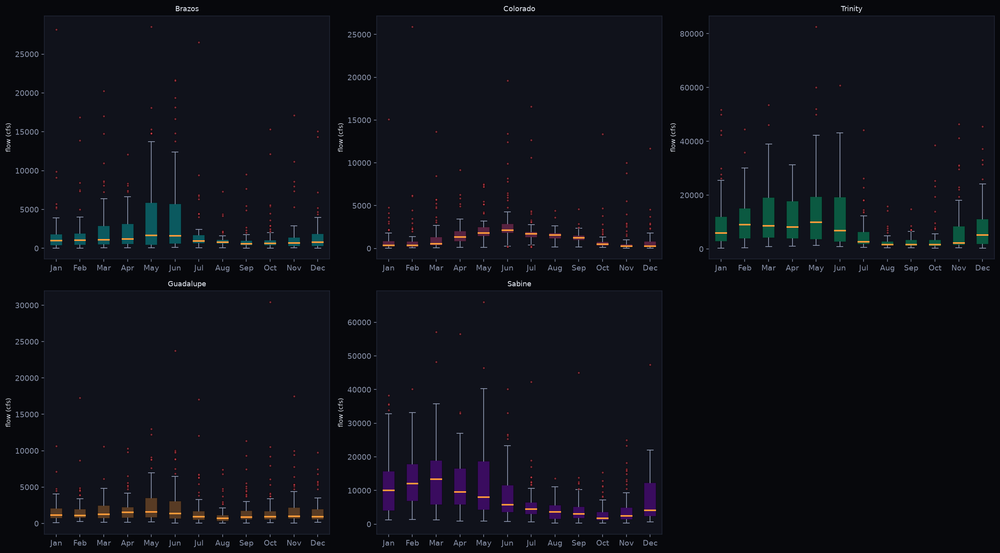

In [23]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    obs = r["obs"]
    years = sorted(obs.keys())
    data = [[obs[y][m_idx] for y in years if np.isfinite(obs[y][m_idx])] for m_idx in range(12)]
    bp = ax.boxplot(data, patch_artist=True, tick_labels=MONTH_ABBR,
                    boxprops=dict(facecolor=RIVER_COLORS[name], alpha=0.3),
                    medianprops=dict(color=AMBER, lw=2),
                    whiskerprops=dict(color=MUTED), capprops=dict(color=MUTED),
                    flierprops=dict(marker="o", markerfacecolor=RED, ms=3, alpha=0.5))
    ax.set_ylabel("flow (cfs)", fontsize=8)
    ax.set_title(name, fontsize=9)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 23. Climate Index Time Series — ONI + PDO


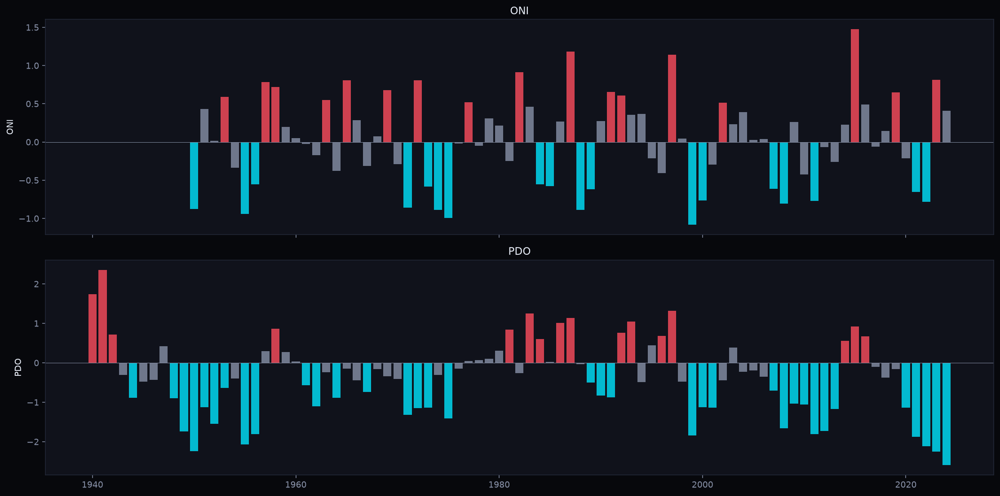

In [24]:
fig, axes = plt.subplots(2, 1, figsize=(16, 8), sharex=True)
for ax, idx, name_idx in [(axes[0], oni, "ONI"), (axes[1], pdo, "PDO")]:
    yrs = sorted(idx.keys())
    vals = [idx[y] for y in yrs]
    colors = [RED if v >= 0.5 else COOL_BLUE if v <= -0.5 else MUTED for v in vals]
    ax.bar(yrs, vals, color=colors, alpha=0.8, width=0.8)
    ax.axhline(0, color=MUTED, lw=0.5)
    ax.set_ylabel(f"{name_idx}")
    ax.set_title(name_idx)
plt.tight_layout(); plt.show()


---
## 24. Decadal Shift — How the Seasonal Shape Evolved


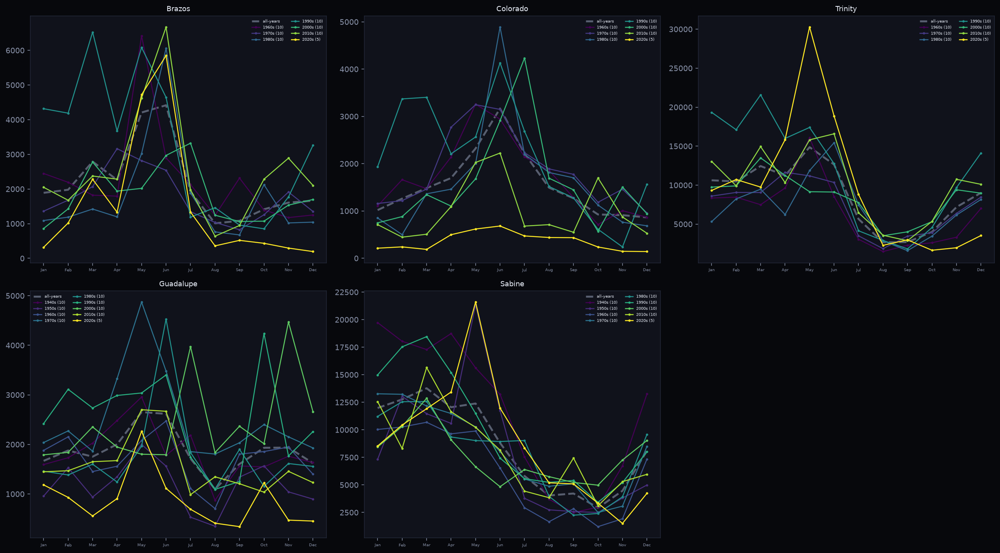

In [25]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
m = range(1, 13)
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    obs = r["obs"]
    years = sorted(obs.keys())
    overall = np.nanmean([obs[y] for y in years], axis=0)
    decades = {}
    for y in years:
        d = (y // 10) * 10
        decades.setdefault(d, []).append(obs[y])
    cmap = plt.get_cmap("viridis")
    dec_list = sorted(decades.keys())
    span = max(1, len(dec_list) - 1)
    ax.plot(m, overall, color=MUTED, lw=2.5, ls="--", alpha=0.6, label="all-years")
    for j, d in enumerate(dec_list):
        dmean = np.nanmean(decades[d], axis=0)
        ax.plot(m, dmean, "-o", ms=2, lw=1.3, color=cmap(j / span), label=f"{d}s ({len(decades[d])})")
    ax.set_xticks(list(m)); ax.set_xticklabels(MONTH_ABBR, fontsize=5)
    ax.set_title(name, fontsize=9)
    ax.legend(fontsize=5, frameon=False, ncol=2)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 25. Anomaly Stripes — Annual Departure from Normal


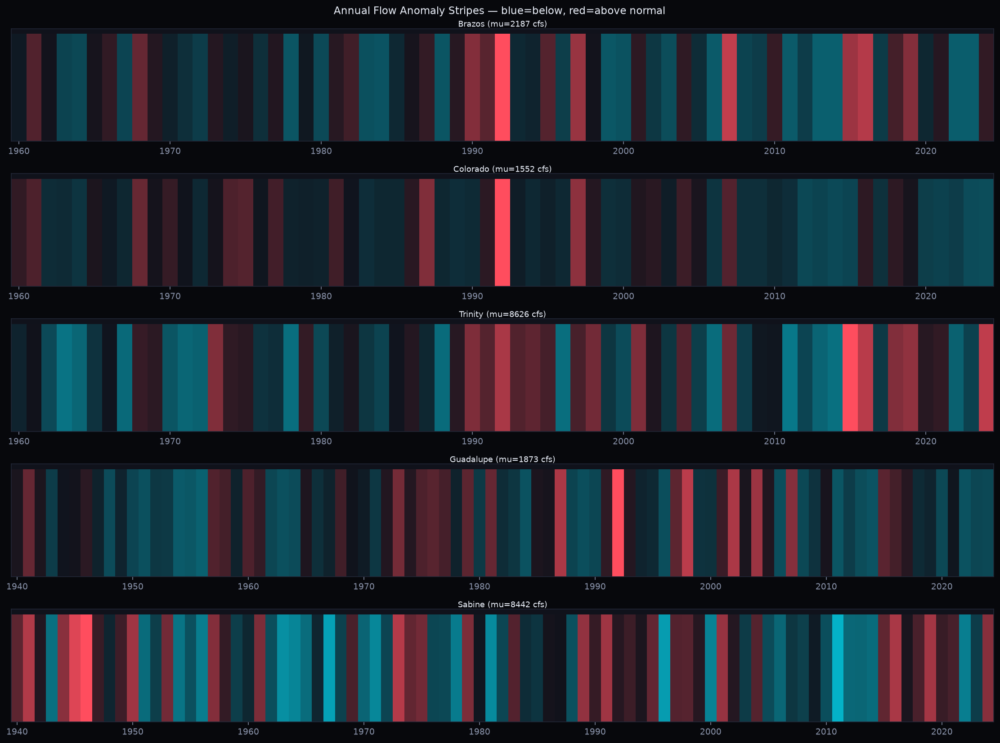

In [26]:
fig, axes = plt.subplots(5, 1, figsize=(16, 12))
cmap_div = LinearSegmentedColormap.from_list("anom", [COOL_BLUE, "#10121b", RED])
for i, (name, r) in enumerate(rivers.items()):
    ax = axes[i]
    obs = r["obs"]
    years = sorted(obs.keys())
    annual = np.array([float(np.nanmean(obs[y])) for y in years])
    normal = np.mean(annual)
    anomalies = annual - normal
    vmax = max(abs(anomalies.min()), abs(anomalies.max()))
    for y, a in zip(years, anomalies):
        ax.bar(y, 1, color=cmap_div((a / vmax + 1) / 2), width=1.0, edgecolor="none")
    ax.set_xlim(min(years) - 0.5, max(years) + 0.5)
    ax.set_yticks([])
    ax.set_title(f"{name} (mu={normal:.0f} cfs)", fontsize=9, pad=2)
plt.suptitle("Annual Flow Anomaly Stripes — blue=below, red=above normal", fontsize=12)
plt.tight_layout(); plt.show()


---
## 26. Cumulative Flow — Water Year Accumulation


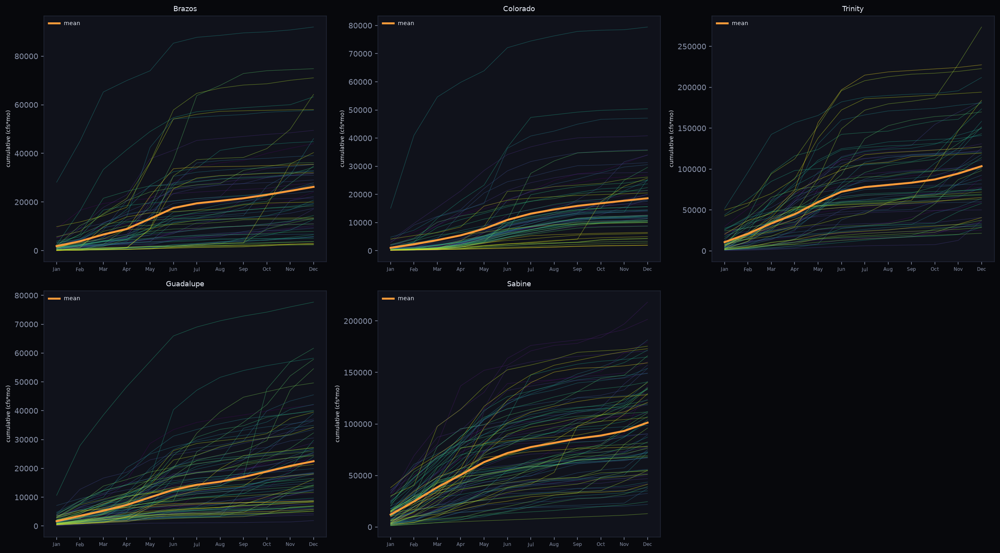

In [27]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    obs = r["obs"]
    years = sorted(obs.keys())
    cmap = plt.get_cmap("viridis")
    span = max(years) - min(years) or 1
    for y in years:
        cumul = np.nancumsum(obs[y])
        ax.plot(range(1, 13), cumul, color=cmap((y - min(years)) / span), lw=0.6, alpha=0.5)
    mean_cumul = np.nancumsum(np.nanmean([obs[y] for y in years], axis=0))
    ax.plot(range(1, 13), mean_cumul, color=AMBER, lw=2.5, label="mean")
    ax.set_xticks(range(1, 13)); ax.set_xticklabels(MONTH_ABBR, fontsize=6)
    ax.set_ylabel("cumulative (cfs*mo)", fontsize=7)
    ax.set_title(name, fontsize=9)
    ax.legend(fontsize=7, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 27. Return Period — Annual Peak Empirical Estimates


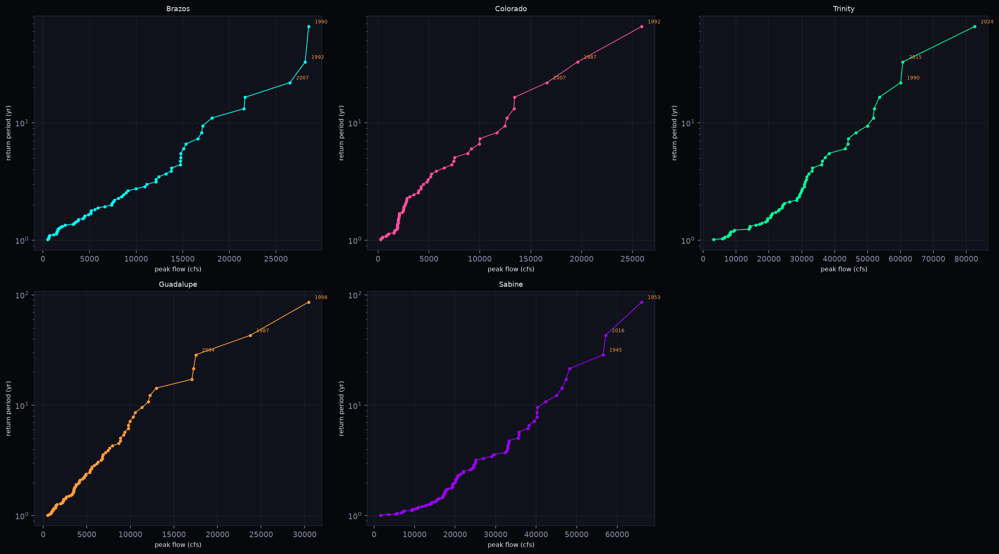

In [28]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    obs = r["obs"]
    years = sorted(obs.keys())
    peaks = np.array([float(np.nanmax(obs[y])) for y in years])
    n = len(peaks)
    sorted_peaks = np.sort(peaks)[::-1]
    rank = np.arange(1, n + 1)
    return_period = (n + 1) / rank
    ax.semilogy(sorted_peaks, return_period, "o-", color=RIVER_COLORS[name], ms=3, lw=1)
    for k in range(min(3, n)):
        yr_idx = int(np.where(peaks == sorted_peaks[k])[0][0])
        ax.annotate(str(years[yr_idx]), xy=(sorted_peaks[k], return_period[k]),
                    xytext=(8, 4), textcoords="offset points", fontsize=6, color=AMBER)
    ax.set_xlabel("peak flow (cfs)", fontsize=8)
    ax.set_ylabel("return period (yr)", fontsize=8)
    ax.set_title(name, fontsize=9)
    ax.grid(True, alpha=0.1, color=MUTED)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 28. Autocorrelogram — Year Memory


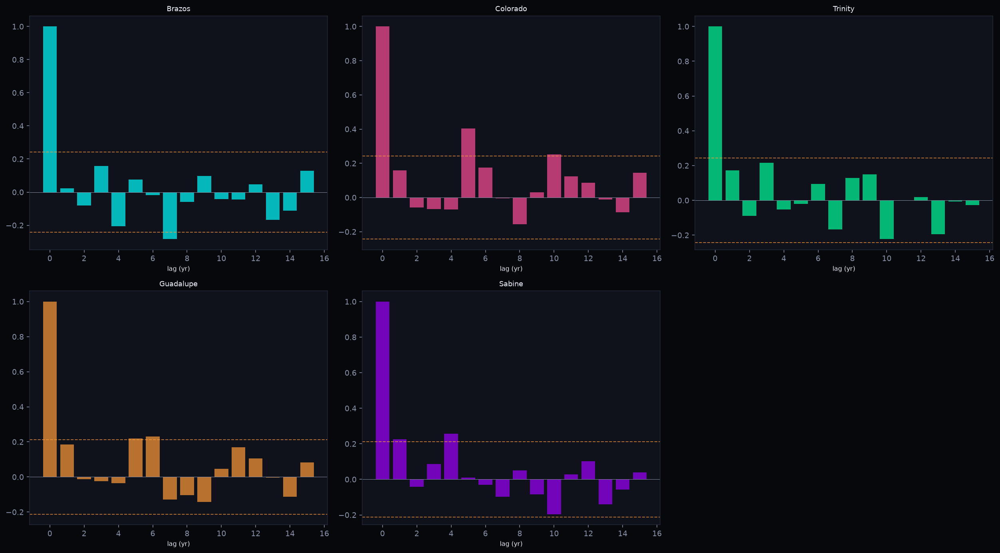

In [29]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    years = sorted(clean.keys())
    annual = np.array([float(np.mean(clean[y])) for y in years])
    n = len(annual)
    mean, var = annual.mean(), annual.var()
    acf = [1.0]
    for lag in range(1, 16):
        if lag >= n: break
        cov = np.mean((annual[:n-lag] - mean) * (annual[lag:] - mean))
        acf.append(cov / var if var > 0 else 0)
    ax.bar(range(len(acf)), acf, color=RIVER_COLORS[name], alpha=0.7, width=0.8)
    ci = 1.96 / np.sqrt(n)
    ax.axhline(ci, color=AMBER, ls="--", lw=1, alpha=0.7)
    ax.axhline(-ci, color=AMBER, ls="--", lw=1, alpha=0.7)
    ax.axhline(0, color=MUTED, lw=0.5)
    ax.set_xlabel("lag (yr)", fontsize=8)
    ax.set_title(name, fontsize=9)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 29. Percentile Rank — Latest Year in Context


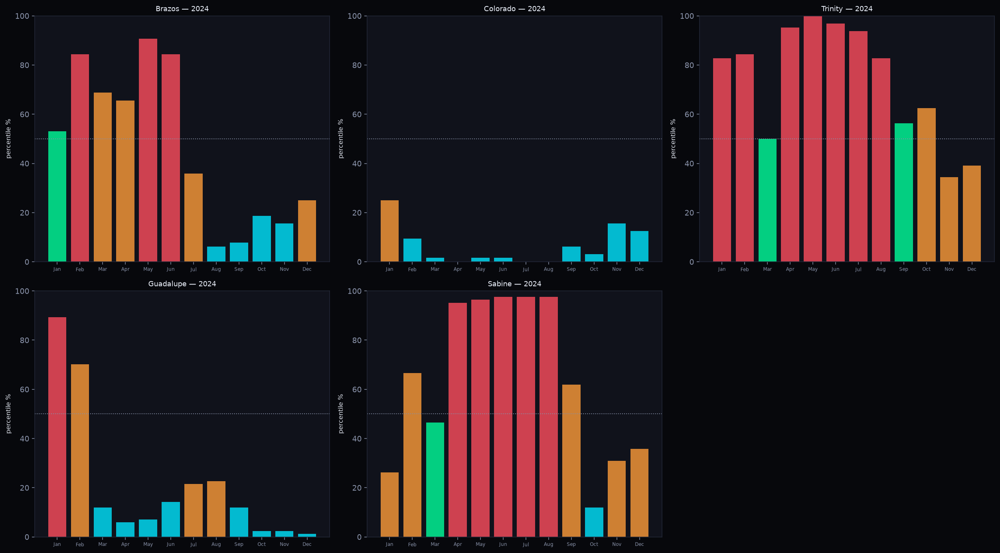

In [30]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    obs = r["obs"]
    years = sorted(obs.keys())
    latest = years[-1]
    latest_flow = obs[latest]
    pctiles = []
    for m_idx in range(12):
        record = np.array([obs[y][m_idx] for y in years if np.isfinite(obs[y][m_idx])])
        if len(record) > 1 and np.isfinite(latest_flow[m_idx]):
            pctiles.append(fm.percentile_rank(latest_flow[m_idx], record))
        else:
            pctiles.append(np.nan)
    colors = [RED if p > 0.8 else COOL_BLUE if p < 0.2 else LIME if 0.4 <= p <= 0.6 else AMBER
              for p in pctiles]
    ax.bar(range(12), [p * 100 for p in pctiles], color=colors, alpha=0.8)
    ax.set_xticks(range(12)); ax.set_xticklabels(MONTH_ABBR, fontsize=6)
    ax.set_ylabel("percentile %", fontsize=8)
    ax.axhline(50, color=MUTED, ls=":", lw=1)
    ax.set_ylim(0, 100)
    ax.set_title(f"{name} — {latest}", fontsize=9)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 30. Multi-Metric Radar — All Five Rivers


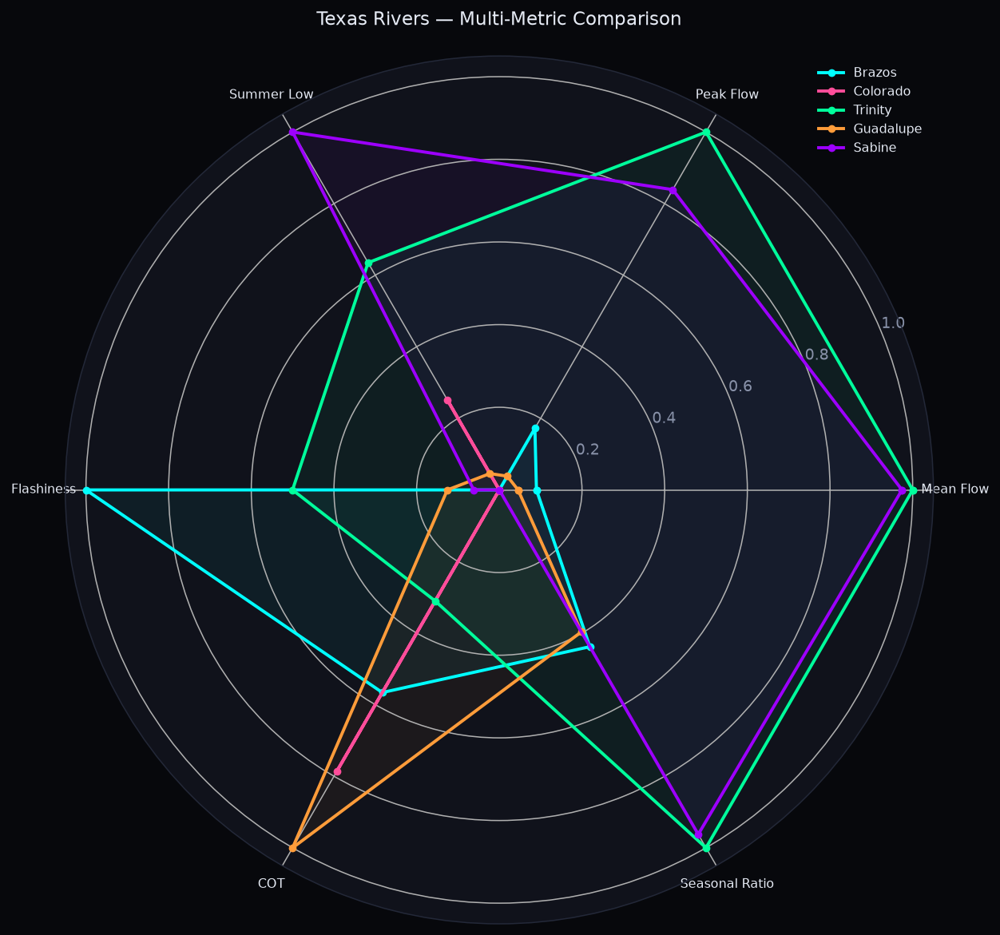

Metric                Brazos    Colorado     Trinity   Guadalupe      Sabine
----------------------------------------------------------------------------
Mean Flow            2187.33     1552.06     8625.73     1873.05     8442.45
Peak Flow            8596.09     4809.34    26806.54     5654.91    23266.09
Summer Low            721.66     1389.00     2410.81      843.15     3382.05
Flashiness              0.71        0.48        0.60        0.51        0.50
COT                     5.86        6.12        5.57        6.36        5.21
Seasonal Ratio          1.27        0.62        2.09        1.21        2.04


In [31]:
def compute_metrics(obs):
    clean = complete_years(obs)
    years = sorted(clean.keys())
    annual = [float(np.mean(clean[y])) for y in years]
    peaks = [float(np.max(clean[y])) for y in years]
    lows = [float(np.min(clean[y][5:8])) for y in years]
    flash = [fm.flashiness(clean[y]) for y in years]
    mean_flow = np.mean([clean[y] for y in years], axis=0)
    return {
        "Mean Flow": np.mean(annual),
        "Peak Flow": np.mean(peaks),
        "Summer Low": np.mean(lows),
        "Flashiness": np.mean(flash),
        "COT": fm.center_of_timing(mean_flow),
        "Seasonal Ratio": np.mean([fm.seasonal_ratio(clean[y]) for y in years]),
    }

all_m = {name: compute_metrics(r["obs"]) for name, r in rivers.items()}
categories = list(list(all_m.values())[0].keys())
N = len(categories)
angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
angles += angles[:1]

# Normalize
all_vals = {k: [all_m[n][k] for n in all_m] for k in categories}
fig, ax = plt.subplots(figsize=(9, 9), subplot_kw=dict(polar=True))
ax.set_facecolor("#10121b")
for name in rivers:
    vals = [(all_m[name][k] - min(all_vals[k])) / (max(all_vals[k]) - min(all_vals[k]) + 1e-9)
            for k in categories]
    vals += vals[:1]
    ax.plot(angles, vals, "o-", color=RIVER_COLORS[name], lw=2, ms=4, label=name)
    ax.fill(angles, vals, color=RIVER_COLORS[name], alpha=0.05)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=8, color=LIGHT)
ax.set_title("Texas Rivers — Multi-Metric Comparison", pad=20)
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout(); plt.show()

print(f"{'Metric':<16}", end="")
for n in rivers: print(f"{n:>12}", end="")
print()
print("-" * (16 + 12 * 5))
for k in categories:
    print(f"{k:<16}", end="")
    for n in rivers: print(f"{all_m[n][k]:>12.2f}", end="")
    print()


---
## 31. Climatological Forecast — Naive Projection


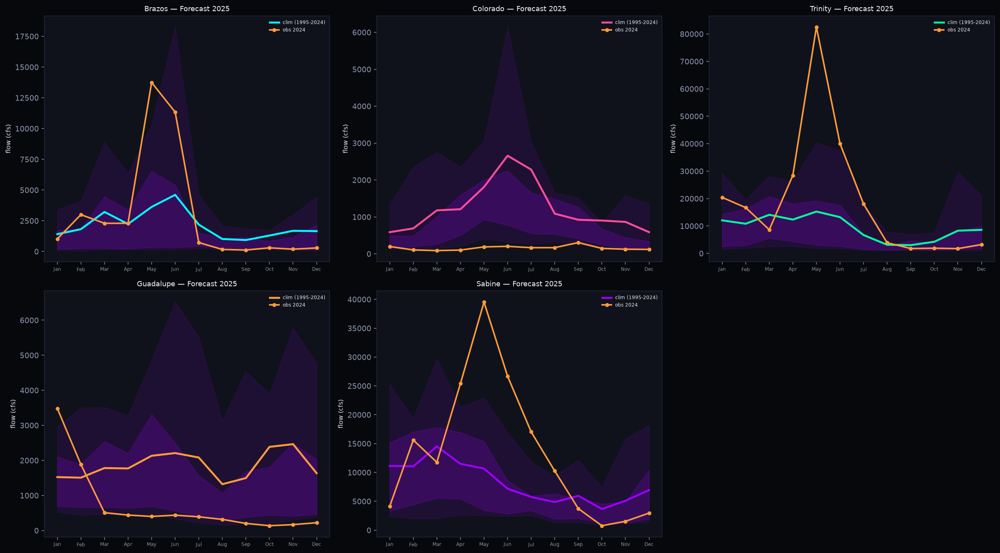

In [32]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
m = range(1, 13)
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    obs = r["obs"]
    years = sorted(obs.keys())
    latest = years[-1]
    clim_years = [y for y in years if y >= latest - 29]
    stack = np.array([obs[y] for y in clim_years])
    clim_mean = np.nanmean(stack, axis=0)
    p10, p90 = np.nanpercentile(stack, 10, axis=0), np.nanpercentile(stack, 90, axis=0)
    p25, p75 = np.nanpercentile(stack, 25, axis=0), np.nanpercentile(stack, 75, axis=0)
    ax.fill_between(m, p10, p90, color=VIOLET, alpha=0.1)
    ax.fill_between(m, p25, p75, color=VIOLET, alpha=0.2)
    ax.plot(m, clim_mean, color=RIVER_COLORS[name], lw=2.5, label=f"clim ({clim_years[0]}-{clim_years[-1]})")
    ax.plot(m, obs[latest], "o-", color=AMBER, lw=2, ms=4, label=f"obs {latest}")
    ax.set_xticks(list(m)); ax.set_xticklabels(MONTH_ABBR, fontsize=6)
    ax.set_ylabel("flow (cfs)", fontsize=8)
    ax.set_title(f"{name} — Forecast {latest+1}", fontsize=9)
    ax.legend(fontsize=6, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 32. ENSO-Conditioned Forecast


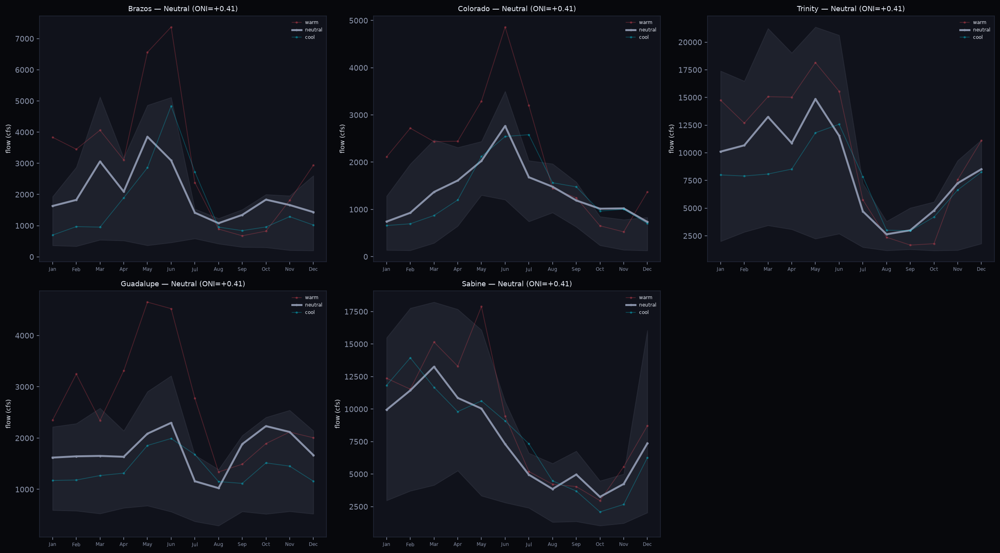

In [33]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
m = range(1, 13)
for i, (name, r) in enumerate(rivers.items()):
    ax = axes.flat[i]
    clean = complete_years(r["obs"])
    latest_oni_year = max(oni.keys())
    current_oni = oni[latest_oni_year]
    phase = "warm" if current_oni >= 0.5 else "cool" if current_oni <= -0.5 else "neutral"
    phase_label = {"warm": "El Nino", "cool": "La Nina", "neutral": "Neutral"}
    pc = fm.composite_hydrographs(clean, oni)
    for ph_name, vec, color in (("warm", pc.warm, RED), ("neutral", pc.neutral, MUTED),
                                 ("cool", pc.cool, COOL_BLUE)):
        if vec is not None:
            alpha = 1.0 if ph_name == phase else 0.25
            lw = 2.5 if ph_name == phase else 1.0
            ax.plot(m, vec, "-o", ms=2, lw=lw, color=color, alpha=alpha, label=ph_name)
    phase_years = getattr(pc, f"{phase}_years")
    if phase_years:
        pd_arr = np.array([clean[y] for y in phase_years if y in clean])
        if len(pd_arr) > 2:
            ax.fill_between(m, np.percentile(pd_arr, 20, axis=0),
                           np.percentile(pd_arr, 80, axis=0), alpha=0.12,
                           color=RED if phase == "warm" else COOL_BLUE if phase == "cool" else MUTED)
    ax.set_xticks(list(m)); ax.set_xticklabels(MONTH_ABBR, fontsize=6)
    ax.set_ylabel("flow (cfs)", fontsize=8)
    ax.set_title(f"{name} — {phase_label[phase]} (ONI={current_oni:+.2f})", fontsize=9)
    ax.legend(fontsize=6, frameon=False)
axes.flat[5].set_visible(False)
plt.tight_layout(); plt.show()


---
## 33. Full Summary Statistics — All Rivers


In [34]:
for name, r in rivers.items():
    clean = complete_years(r["obs"])
    years = sorted(clean.keys())
    annual = np.array([float(np.mean(clean[y])) for y in years])
    peaks = np.array([float(np.max(clean[y])) for y in years])
    lows = np.array([float(np.min(clean[y][5:8])) for y in years])
    mean_hydro = np.mean([clean[y] for y in years], axis=0)
    mk_ann = fm.mann_kendall(annual)
    mk_peak = fm.mann_kendall(peaks)
    mk_low = fm.mann_kendall(lows)
    tt = fm.center_of_timing_trend(clean)
    oni_r = fm.correlate({y: float(np.max(clean[y])) for y in years}, oni)
    pdo_r = fm.correlate({y: float(np.max(clean[y])) for y in years}, pdo)
    print(f"{'='*60}")
    print(f"  {name} River ({r['site']})")
    print(f"{'='*60}")
    print(f"  Record:              {years[0]}-{years[-1]} ({len(years)} complete years)")
    print(f"  Mean annual flow:    {np.mean(annual):,.1f} cfs")
    print(f"  Std annual flow:     {np.std(annual):,.1f} cfs")
    print(f"  Mean peak monthly:   {np.mean(peaks):,.1f} cfs")
    print(f"  Mean summer low:     {np.mean(lows):,.1f} cfs")
    print(f"  Center of timing:    {fm.center_of_timing(mean_hydro):.2f}")
    print(f"  Flashiness:          {np.mean([fm.flashiness(clean[y]) for y in years]):.4f}")
    print(f"  Seasonal ratio:      {np.mean([fm.seasonal_ratio(clean[y]) for y in years]):.2f}")
    print(f"  Annual trend:        {mk_ann.trend} (tau={mk_ann.tau:+.3f}, p={mk_ann.p:.4f})")
    print(f"  Peak trend:          {mk_peak.trend} (tau={mk_peak.tau:+.3f}, p={mk_peak.p:.4f})")
    print(f"  Low-flow trend:      {mk_low.trend} (tau={mk_low.tau:+.3f}, p={mk_low.p:.4f})")
    print(f"  Timing drift:        {tt.days_per_decade:+.1f} days/decade ({tt.trend})")
    print(f"  Sen slope:           {fm.sens_slope(annual):+.2f} cfs/yr")
    print(f"  Peak x ONI:          r = {oni_r:+.3f}")
    print(f"  Peak x PDO:          r = {pdo_r:+.3f}")
    print()


  Brazos River (08096500)
  Record:              1960-2024 (65 complete years)
  Mean annual flow:    2,187.3 cfs
  Std annual flow:     1,632.1 cfs
  Mean peak monthly:   8,596.1 cfs
  Mean summer low:     721.7 cfs
  Center of timing:    5.86
  Flashiness:          0.7098
  Seasonal ratio:      1.27
  Annual trend:        none (tau=-0.041, p=0.6304)
  Peak trend:          none (tau=-0.034, p=0.6961)
  Low-flow trend:      decreasing (tau=-0.292, p=0.0006)
  Timing drift:        -1.5 days/decade (none)
  Sen slope:           -6.30 cfs/yr
  Peak x ONI:          r = +0.343
  Peak x PDO:          r = +0.169

  Colorado River (08158000)
  Record:              1960-2024 (65 complete years)
  Mean annual flow:    1,552.1 cfs
  Std annual flow:     1,092.4 cfs
  Mean peak monthly:   4,809.3 cfs
  Mean summer low:     1,389.0 cfs
  Center of timing:    6.12
  Flashiness:          0.4823
  Seasonal ratio:      0.62
  Annual trend:        decreasing (tau=-0.300, p=0.0004)
  Peak trend:         

---
## Report Complete

**33 panels** covering every forecast, histogram, trend, distribution, and
teleconnection analysis in the hydro-art analytics suite — applied to five
major Texas rivers spanning the state from the Sabine (east) to the Rio Grande (south).

**Rivers analyzed:**
- Brazos River at Waco (08096500) — 65 years
- Colorado River at Austin (08158000) — 65 years
- Trinity River at Romayor (08066500) — 65 years
- Guadalupe River at Victoria (08176500) — 85 years
- Sabine River near Ruliff (08030500) — 85 years

**Analyses:** YoY hydrographs, typical year, all-rivers overlay, long-record trend,
summer low, peak flow, timing drift, ENSO teleconnection (ONI+PDO x 5 rivers),
ENSO composites, flow-duration by decade, analog years, record book, seasonal ratio,
flashiness, rolling normals, monthly histograms, annual KDE, cross-gauge correlation
matrix, heatmaps, box plots, climate indices, decadal shift, anomaly stripes,
cumulative flow, return period, autocorrelogram, percentile context, multi-metric
radar, climatological forecast, ENSO-conditioned forecast, full summary table.

**Data sources (all federal public domain):**
- USGS NWIS daily-value discharge
- NOAA CPC Oceanic Nino Index (ONI)
- NOAA NCEI Pacific Decadal Oscillation (PDO)
